# Feature Exploration — IPL Jersey Classification

**Goal:** Visually compare how different hand-crafted features distinguish IPL team jerseys.

Companion to `explore.ipynb`: that one walks the full pipeline on a single image; this one is *horizontal* — it takes jersey patches from multiple teams and runs each feature side-by-side so we can see *which features actually separate teams*.

## Why this matters

We are not allowed to use CNNs. Every bit of discriminative power has to come from hand-crafted features. So we need to know which feature carries which signal:

| Question                                                  | Best feature(s)                                                      |
| --------------------------------------------------------- | -------------------------------------------------------------------- |
| Jersey vs pitch/sky/crowd?                                | HSV saturation, dominant color, edge density                         |
| Color family (yellow / blue / red)?                       | HSV histogram, LAB histogram, K-Means dominant colors                |
| Yellow CSK vs gold GT (very close hues)?                  | LAB `a*`/`b*`, joint H×S 2D histogram, dominant-color *pairs*        |
| MI royal-blue vs DC navy vs LSG light-blue?               | Color moments (mean/std), LAB `b*`, V channel stats                  |
| Plain vs striped vs logo-heavy?                           | HOG, LBP, Gabor, GLCM                                                |
| Edges of logos/numbers vs flat fabric?                    | Canny, Sobel                                                         |
| Player vs crowd wearing same color?                       | HOG (structural), edge density                                       |

## Edge cases probed (from `EdgeCases.md`)

1. Hue conflicts — CSK yellow vs GT gold.
2. Lighting — floodlight V-drop, daylight overexposure.
3. Background contamination — sponsor boards, crowd, sight screen.
4. Blur / motion — Laplacian variance.
5. White-on-white — LSG alt vs sight-screen disambiguation.

---
## 0. Setup

In [1]:
import os
from pathlib import Path
from collections import defaultdict
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.cluster import KMeans
from skimage.feature import hog, local_binary_pattern, graycomatrix, graycoprops, canny
from skimage.filters import gabor, sobel
from skimage import exposure

np.random.seed(0)
plt.rcParams['figure.dpi'] = 90

SAMPLE_DIR = Path('../sample images')
assert SAMPLE_DIR.exists(), f"Sample dir not found: {SAMPLE_DIR.resolve()}"

GRID_ROWS, GRID_COLS = 8, 8
IMG_W, IMG_H = 800, 600
CELL_W, CELL_H = IMG_W // GRID_COLS, IMG_H // GRID_ROWS   # 100 x 75
print(f'Cell size: {CELL_W} x {CELL_H} px')

Cell size: 100 x 75 px


### 0.1 Load and resize sample images

Each sample image is a multi-team frame, so it can give us ≥2 jersey patches.

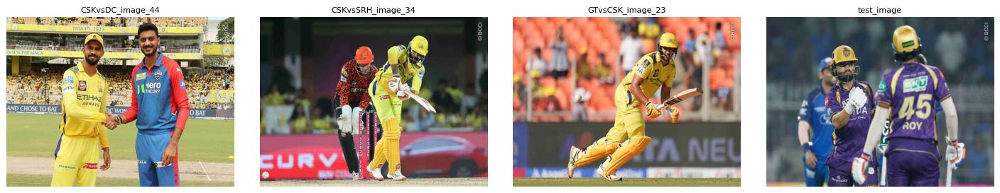

In [2]:
def load_resize_rgb(path, size=(IMG_W, IMG_H)):
    bgr = cv2.imread(str(path))
    if bgr is None:
        raise FileNotFoundError(path)
    if bgr.shape[:2] != (size[1], size[0]):
        bgr = cv2.resize(bgr, size, interpolation=cv2.INTER_AREA)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

IMAGE_FILES = sorted([p for p in SAMPLE_DIR.iterdir() if p.suffix.lower() in {'.jpg', '.jpeg', '.png'}])
IMAGES = {p.stem: load_resize_rgb(p) for p in IMAGE_FILES}

fig, axes = plt.subplots(1, len(IMAGES), figsize=(4 * len(IMAGES), 3))
if len(IMAGES) == 1:
    axes = [axes]
for ax, (name, img) in zip(axes, IMAGES.items()):
    ax.imshow(img); ax.set_title(name, fontsize=9); ax.axis('off')
plt.tight_layout(); plt.show()

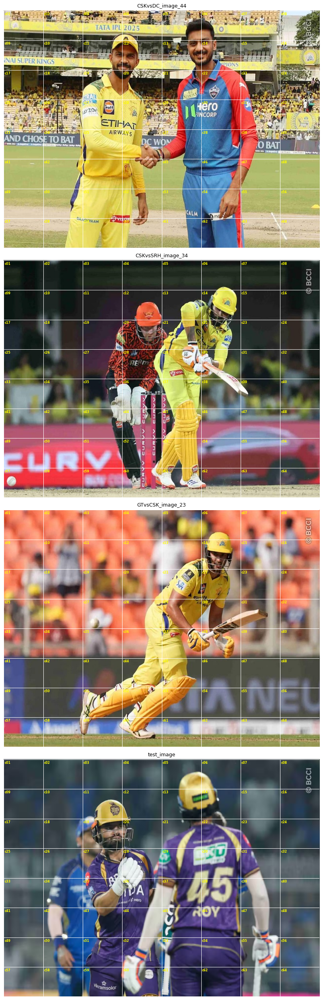

In [6]:
import matplotlib.patches as mpatches

fig, axes = plt.subplots(len(IMAGES), 1, figsize=(12, 7 * len(IMAGES)))
if len(IMAGES) == 1:
    axes = [axes]
for ax, (name, img) in zip(axes, IMAGES.items()):
    ax.imshow(img)
    for r in range(GRID_ROWS):
        for c in range(GRID_COLS):
            x, y = c * CELL_W, r * CELL_H
            ax.add_patch(mpatches.Rectangle(
                (x, y), CELL_W, CELL_H,
                linewidth=0.8, edgecolor='white', facecolor='none'
            ))
            cell_num = r * GRID_COLS + c + 1
            ax.text(x + 2, y + 11, f'c{cell_num:02d}',
                    color='yellow', fontsize=6, fontweight='bold')
    ax.set_title(name, fontsize=10)
    ax.axis('off')

plt.tight_layout(); plt.show()

---
## 1. Build a Team-Patch Registry

To compare features *across teams* we need patches that belong to different jerseys. We pick patches automatically via a small heuristic:

1. Mask high-saturation pixels (`S > 0.35`) — these are jersey-fabric candidates (pitch / sky / skin / umpire-white collapse to low S).
2. Cluster those pixels by *hue* into 2 groups → one cluster per team in that image.
3. For each cluster, pick the 8×8 grid cell whose pixels are most concentrated in that cluster.
4. Label the patch by its coarse hue family (`yellow`, `orange`, `blue`, `purple`, ...).

If a patch looks wrong, override it in `OVERRIDES` below with an explicit cell index (1–64).

In [8]:
def get_cell(img, cell_idx_1based):
    idx = cell_idx_1based - 1
    r, c = idx // GRID_COLS, idx % GRID_COLS
    return img[r * CELL_H:(r + 1) * CELL_H, c * CELL_W:(c + 1) * CELL_W]

def hue_family(h_deg, s):
    if s < 0.15:           return 'neutral'
    if h_deg < 15 or h_deg >= 345: return 'red'
    if h_deg < 35:  return 'orange'
    if h_deg < 65:  return 'yellow'
    if h_deg < 95:  return 'gold/lime'
    if h_deg < 165: return 'green'
    if h_deg < 200: return 'cyan'
    if h_deg < 255: return 'blue'
    if h_deg < 295: return 'purple'
    return 'magenta'

def auto_team_patches(img_rgb, n_teams=2, sat_thresh=0.35):
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[..., 0] *= (360.0 / 180.0)     # OpenCV stores H in [0, 180]
    hsv[..., 1] /= 255.0; hsv[..., 2] /= 255.0
    H, S, V = hsv[..., 0], hsv[..., 1], hsv[..., 2]
    mask = (S > sat_thresh) & (V > 0.15) & (V < 0.98)
    if mask.sum() < 100:
        return []
    h_rad = np.deg2rad(H[mask])
    feats = np.stack([np.cos(h_rad), np.sin(h_rad)], axis=1)
    k = min(n_teams, max(1, mask.sum() // 200))
    km = KMeans(n_clusters=k, n_init=5, random_state=0).fit(feats)
    label_map = -np.ones(mask.shape, dtype=int)
    label_map[mask] = km.labels_
    out, used = [], set()
    for cl in range(k):
        scores = np.zeros(GRID_ROWS * GRID_COLS)
        for r in range(GRID_ROWS):
            for c in range(GRID_COLS):
                cell_lbl = label_map[r*CELL_H:(r+1)*CELL_H, c*CELL_W:(c+1)*CELL_W]
                scores[r*GRID_COLS + c] = (cell_lbl == cl).sum()
        for cell_idx in scores.argsort()[::-1]:
            if int(cell_idx) not in used and scores[cell_idx] > 50:
                used.add(int(cell_idx))
                cell_1b = int(cell_idx) + 1
                cx, cy = km.cluster_centers_[cl]
                h_deg = (np.rad2deg(np.arctan2(cy, cx)) + 360) % 360
                cell_img = get_cell(img_rgb, cell_1b)
                rep_s = cv2.cvtColor(cell_img, cv2.COLOR_RGB2HSV)[..., 1].mean() / 255.0
                out.append({'cell': cell_1b, 'hue_deg': float(h_deg), 'family': hue_family(h_deg, rep_s)})
                break
    return out

# Manual overrides go here: {image_stem: [cell_idx_1, cell_idx_2, ...]}
OVERRIDES = {
    'CSKvsDC_image_44': [43, 38],
    'CSKvsSRH_image_34': [37, 28],
    'test_image':        [51, 34],
}

PATCH_REGISTRY = []
for name, img in IMAGES.items():
    if name in OVERRIDES:
        for cell_1b in OVERRIDES[name]:
            cell_img = get_cell(img, cell_1b)
            hsv = cv2.cvtColor(cell_img, cv2.COLOR_RGB2HSV)
            h_deg = (hsv[..., 0].mean() * 2) % 360
            fam = hue_family(h_deg, hsv[..., 1].mean() / 255.0)
            PATCH_REGISTRY.append({'image': name, 'cell': cell_1b, 'family': fam, 'hue_deg': float(h_deg), 'rgb': cell_img})
    else:
        for p in auto_team_patches(img, n_teams=2):
            p['image'] = name
            p['rgb'] = get_cell(img, p['cell'])
            PATCH_REGISTRY.append(p)

print(f'Found {len(PATCH_REGISTRY)} team patches:')
for p in PATCH_REGISTRY:
    print(f"  {p['image']:<26s} cell c{p['cell']:02d}  hue={p['hue_deg']:6.1f}°  family={p['family']}")

Found 8 team patches:
  CSKvsDC_image_44           cell c43  hue=  48.6°  family=yellow
  CSKvsDC_image_44           cell c38  hue= 205.5°  family=blue
  CSKvsSRH_image_34          cell c37  hue=  82.0°  family=gold/lime
  CSKvsSRH_image_34          cell c28  hue=  74.0°  family=gold/lime
  GTvsCSK_image_23           cell c29  hue=  25.6°  family=orange
  GTvsCSK_image_23           cell c41  hue= 230.3°  family=blue
  test_image                 cell c51  hue= 239.5°  family=blue
  test_image                 cell c34  hue= 203.7°  family=blue


### 1.1 Sanity check — show every patch with its source image

Yellow rectangle = picked cell. If a rectangle isn't on a jersey, add a manual override above and re-run.

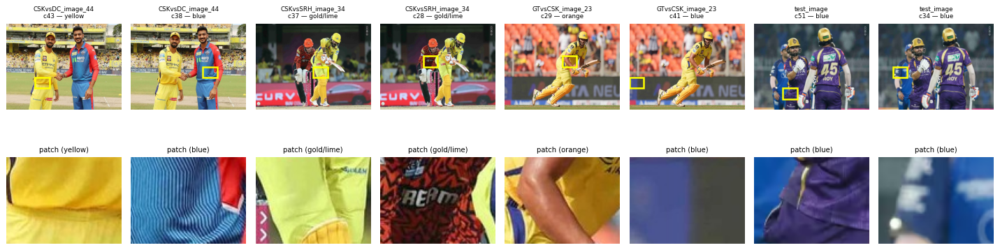

In [9]:
def cell_xywh(cell_1b):
    idx = cell_1b - 1
    r, c = idx // GRID_COLS, idx % GRID_COLS
    return c * CELL_W, r * CELL_H, CELL_W, CELL_H

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(2, n, figsize=(2.0 * n, 5))
if n == 1:
    axes = axes.reshape(2, 1)
for col, p in enumerate(PATCH_REGISTRY):
    axes[0, col].imshow(IMAGES[p['image']])
    x, y, w, h = cell_xywh(p['cell'])
    axes[0, col].add_patch(mpatches.Rectangle((x, y), w, h, lw=2, ec='yellow', fc='none'))
    axes[0, col].set_title(f"{p['image']}\nc{p['cell']:02d} — {p['family']}", fontsize=7)
    axes[0, col].axis('off')
    axes[1, col].imshow(p['rgb'])
    axes[1, col].set_title(f"patch ({p['family']})", fontsize=8); axes[1, col].axis('off')
plt.tight_layout(); plt.show()

---
## 2. HSV Color Histogram

**What it captures:** the *distribution* of hue / saturation / value across the cell. Robust to small spatial shifts — only the colour mix matters.

**Works well when:** team colours are well-separated on the hue wheel (CSK yellow vs MI blue vs RR pink).

**Fails when:** two teams share a hue (CSK yellow vs GT gold, MI royal-blue vs DC navy). See §2.2.

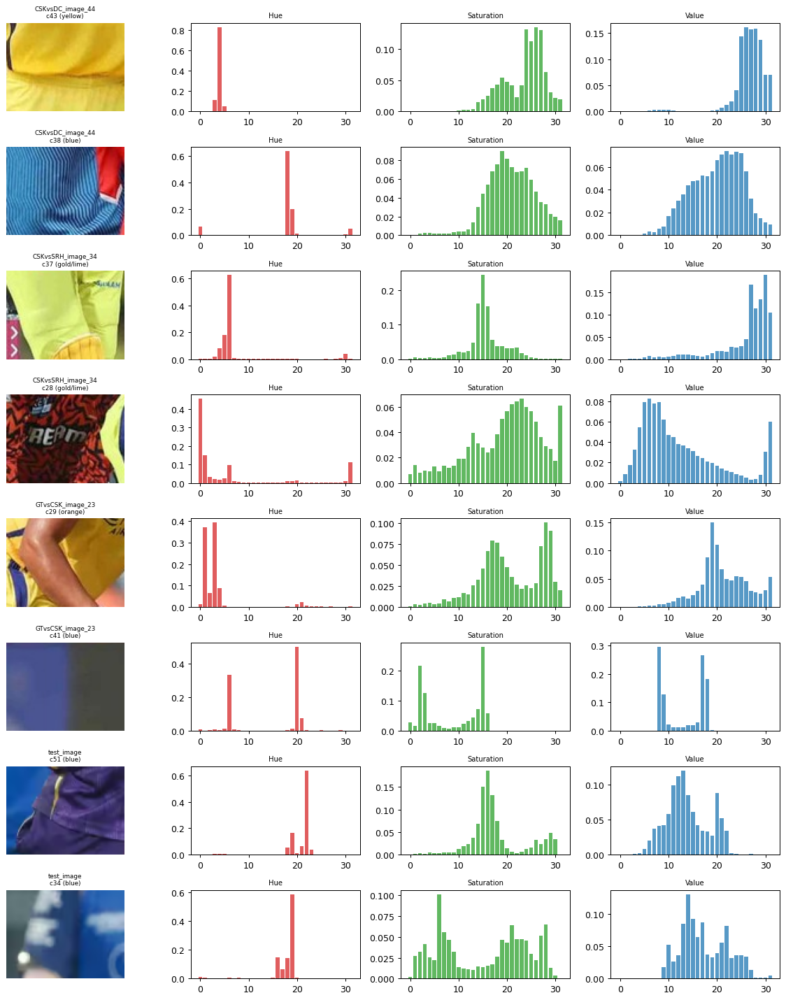

In [10]:
def hsv_hist(patch_rgb, bins=32):
    hsv = cv2.cvtColor(patch_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[..., 0] /= 179.0; hsv[..., 1] /= 255.0; hsv[..., 2] /= 255.0
    feats = []
    for ch in range(3):
        h, _ = np.histogram(hsv[..., ch], bins=bins, range=(0, 1))
        feats.append(h / (h.sum() + 1e-9))
    return feats  # [H, S, V]

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(n, 4, figsize=(13, 2.0 * n))
if n == 1:
    axes = axes.reshape(1, 4)
for row, p in enumerate(PATCH_REGISTRY):
    H, S, V = hsv_hist(p['rgb'])
    axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
    axes[row, 0].set_title(f"{p['image'][:18]}\nc{p['cell']:02d} ({p['family']})", fontsize=7)
    axes[row, 1].bar(range(len(H)), H, color='tab:red',   alpha=0.75); axes[row, 1].set_title('Hue', fontsize=8)
    axes[row, 2].bar(range(len(S)), S, color='tab:green', alpha=0.75); axes[row, 2].set_title('Saturation', fontsize=8)
    axes[row, 3].bar(range(len(V)), V, color='tab:blue',  alpha=0.75); axes[row, 3].set_title('Value', fontsize=8)
plt.tight_layout(); plt.show()

**Reading the chart:** one strong hue peak per jersey patch is the ideal signature. If two patches peak at the same bin → that's where colour-only confuses teams.

### 2.1 Pairwise hue-histogram distance (chi-squared)

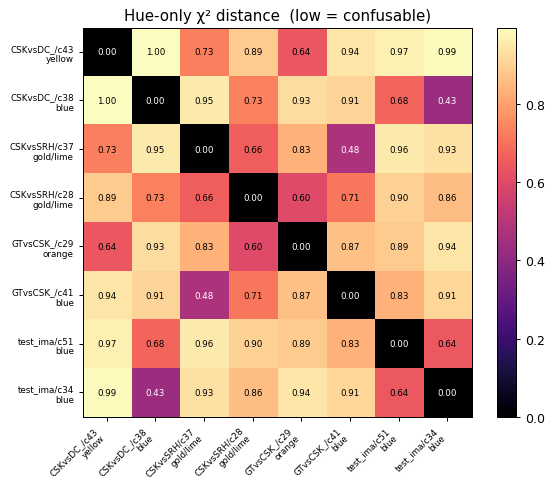

In [11]:
def chi2(a, b, eps=1e-9):
    return 0.5 * np.sum((a - b) ** 2 / (a + b + eps))

n = len(PATCH_REGISTRY)
labels = [f"{p['image'][:8]}/c{p['cell']:02d}\n{p['family']}" for p in PATCH_REGISTRY]
H_hists = [hsv_hist(p['rgb'])[0] for p in PATCH_REGISTRY]
D = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        D[i, j] = chi2(H_hists[i], H_hists[j])

fig, ax = plt.subplots(figsize=(1.0 + 0.7 * n, 0.8 + 0.6 * n))
im = ax.imshow(D, cmap='magma')
ax.set_xticks(range(n)); ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=7)
ax.set_yticks(range(n)); ax.set_yticklabels(labels, fontsize=7)
for i in range(n):
    for j in range(n):
        ax.text(j, i, f'{D[i,j]:.2f}', ha='center', va='center',
                color='white' if D[i, j] < D.max() * 0.6 else 'black', fontsize=7)
ax.set_title('Hue-only χ² distance  (low = confusable)')
plt.colorbar(im, ax=ax, fraction=0.04); plt.tight_layout(); plt.show()


### 2.2 Joint H × S 2-D histogram (the EdgeCases.md fix)

EdgeCases.md: *"Never use Hue alone. Always use joint H×S 2D histogram."* — gold and pure yellow share H bins but differ in S.

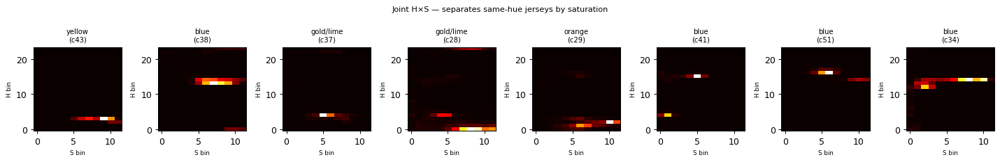

In [12]:
def hs_hist2d(patch_rgb, h_bins=24, s_bins=12):
    hsv = cv2.cvtColor(patch_rgb, cv2.COLOR_RGB2HSV)
    h2 = cv2.calcHist([hsv], [0, 1], None, [h_bins, s_bins], [0, 180, 0, 256])
    cv2.normalize(h2, h2)
    return h2

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(1, n, figsize=(2.0 * n, 2.6))
if n == 1:
    axes = [axes]
for ax, p in zip(axes, PATCH_REGISTRY):
    ax.imshow(hs_hist2d(p['rgb']), origin='lower', aspect='auto', cmap='hot')
    ax.set_title(f"{p['family']}\n(c{p['cell']:02d})", fontsize=8)
    ax.set_xlabel('S bin', fontsize=7); ax.set_ylabel('H bin', fontsize=7)
plt.suptitle('Joint H×S — separates same-hue jerseys by saturation', fontsize=9)
plt.tight_layout(); plt.show()

---
## 3. LAB Color Space + Color Moments

**LAB** decouples lightness (`L*`) from chroma (`a*`, `b*`):
- `a*` runs green ↔ red
- `b*` runs blue ↔ yellow

Better than HSV for nearby warm hues: CSK-yellow and GT-gold sit at clearly different `b*` even when their hues overlap. It is what perceptual ΔE is built on → near-identical jerseys land at near-identical `(a*, b*)` regardless of lighting magnitude.

**Color moments** = mean / std / skew per channel. Just 9 numbers and surprisingly discriminative when the cell is mostly fabric.

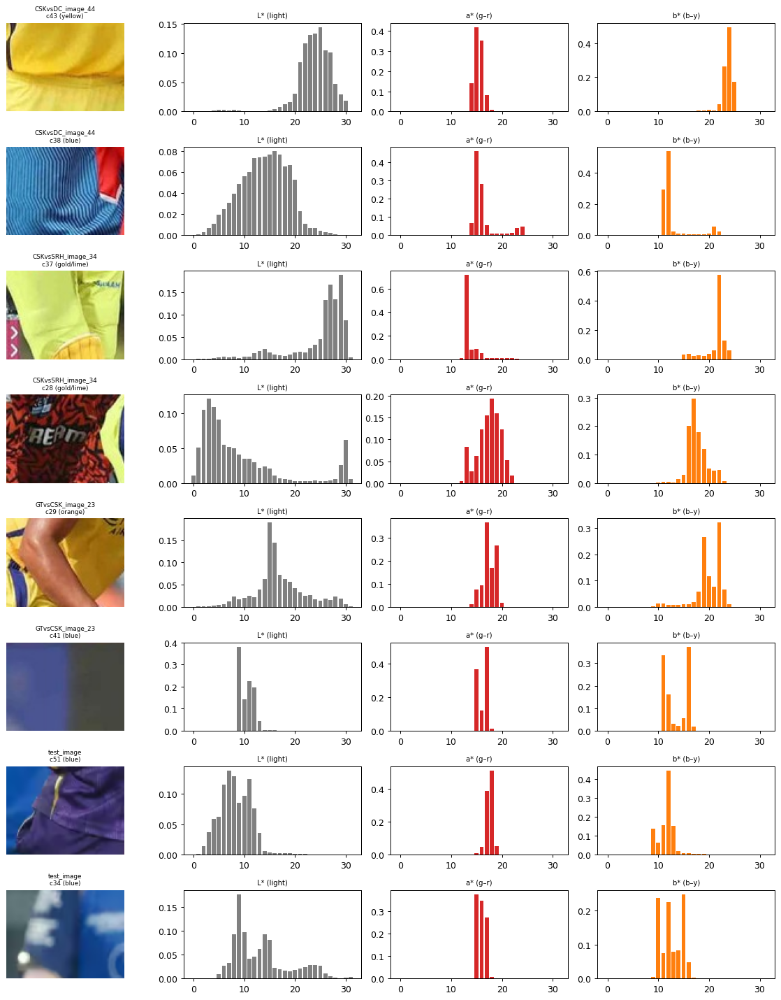

In [13]:
def lab_hist(patch_rgb, bins=32):
    lab = cv2.cvtColor(patch_rgb, cv2.COLOR_RGB2LAB)
    return [np.histogram(lab[..., ch], bins=bins, range=(0, 256))[0] / (lab[..., ch].size + 1e-9) for ch in range(3)]

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(n, 4, figsize=(13, 2.0 * n))
if n == 1:
    axes = axes.reshape(1, 4)
for row, p in enumerate(PATCH_REGISTRY):
    L, A, B = lab_hist(p['rgb'])
    axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
    axes[row, 0].set_title(f"{p['image'][:18]}\nc{p['cell']:02d} ({p['family']})", fontsize=7)
    axes[row, 1].bar(range(len(L)), L, color='gray');       axes[row, 1].set_title('L* (light)', fontsize=8)
    axes[row, 2].bar(range(len(A)), A, color='tab:red');    axes[row, 2].set_title('a* (g–r)', fontsize=8)
    axes[row, 3].bar(range(len(B)), B, color='tab:orange'); axes[row, 3].set_title('b* (b–y)', fontsize=8)
plt.tight_layout(); plt.show()

In [14]:
def color_moments(patch_rgb, space='LAB'):
    cvt = cv2.COLOR_RGB2LAB if space == 'LAB' else cv2.COLOR_RGB2HSV
    arr = cv2.cvtColor(patch_rgb, cvt).astype(np.float32)
    means = arr.mean(axis=(0, 1))
    stds  = arr.std (axis=(0, 1))
    skews = ((arr - means) ** 3).mean(axis=(0, 1)) / (stds ** 3 + 1e-6)
    return means, stds, skews

rows = []
for p in PATCH_REGISTRY:
    mu, sd, _ = color_moments(p['rgb'], space='LAB')
    rows.append({
        'patch':  f"{p['image'][:12]}/c{p['cell']:02d}",
        'family': p['family'],
        'L_mean': round(float(mu[0]), 1), 'a_mean': round(float(mu[1]), 1), 'b_mean': round(float(mu[2]), 1),
        'L_std':  round(float(sd[0]), 1), 'a_std':  round(float(sd[1]), 1), 'b_std':  round(float(sd[2]), 1),
    })
print('LAB color moments (mean & std per channel):')
print(pd.DataFrame(rows).to_string(index=False))

LAB color moments (mean & std per channel):
           patch    family  L_mean  a_mean  b_mean  L_std  a_std  b_std
CSKvsDC_imag/c43    yellow   194.4   126.9   193.3   27.1    6.0    9.0
CSKvsDC_imag/c38      blue   115.2   134.0   105.8   37.5   20.7   23.3
CSKvsSRH_ima/c37 gold/lime   204.3   112.9   175.0   44.4   14.2   16.5
CSKvsSRH_ima/c28 gold/lime    75.1   143.3   144.6   67.1   17.9   14.9
GTvsCSK_imag/c29    orange   138.6   143.4   164.1   40.3   10.1   20.7
GTvsCSK_imag/c41      blue    86.9   134.0   112.0   10.6    7.2   17.8
  test_image/c51      blue    69.9   143.9    96.5   25.1    5.1   11.9
  test_image/c34      blue   109.6   130.9   104.2   44.0    6.8   16.4


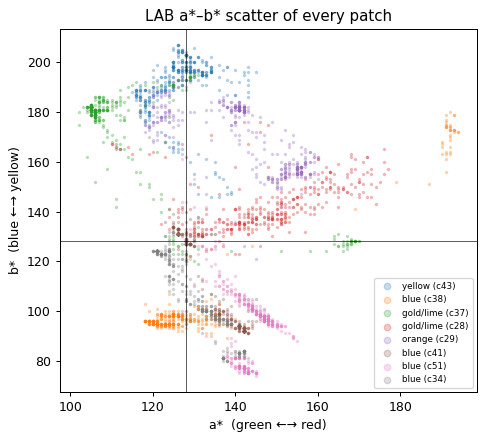

In [15]:
# Scatter of patches in a*-b* space — visually shows per-team color cluster
fig, ax = plt.subplots(figsize=(5.5, 5))
for p in PATCH_REGISTRY:
    lab = cv2.cvtColor(p['rgb'], cv2.COLOR_RGB2LAB).reshape(-1, 3)
    ax.scatter(lab[::20, 1], lab[::20, 2], s=3, alpha=0.25, label=f"{p['family']} (c{p['cell']:02d})")
ax.axhline(128, color='k', lw=0.5); ax.axvline(128, color='k', lw=0.5)
ax.set_xlabel('a*  (green ←→ red)'); ax.set_ylabel('b*  (blue ←→ yellow)')
ax.set_title('LAB a*–b* scatter of every patch')
ax.legend(fontsize=7, markerscale=3, loc='best'); plt.tight_layout(); plt.show()

**What to look for:** yellow jerseys sit in the upper half (`b* > 128`), blue jerseys in the lower half. Reds shift right on `a*`. Two same-family patches that land at clearly different `(a*, b*)` cluster centres → LAB moments alone can separate them where HSV could not.

---
## 4. Dominant Colors via K-Means

**Why:** every IPL jersey has *at least two* signature colours (KKR is purple+gold, RR is pink+blue, CSK is yellow+blue trim). Characterising a patch by its top-K dominant colours captures the **palette**, not just one peak.

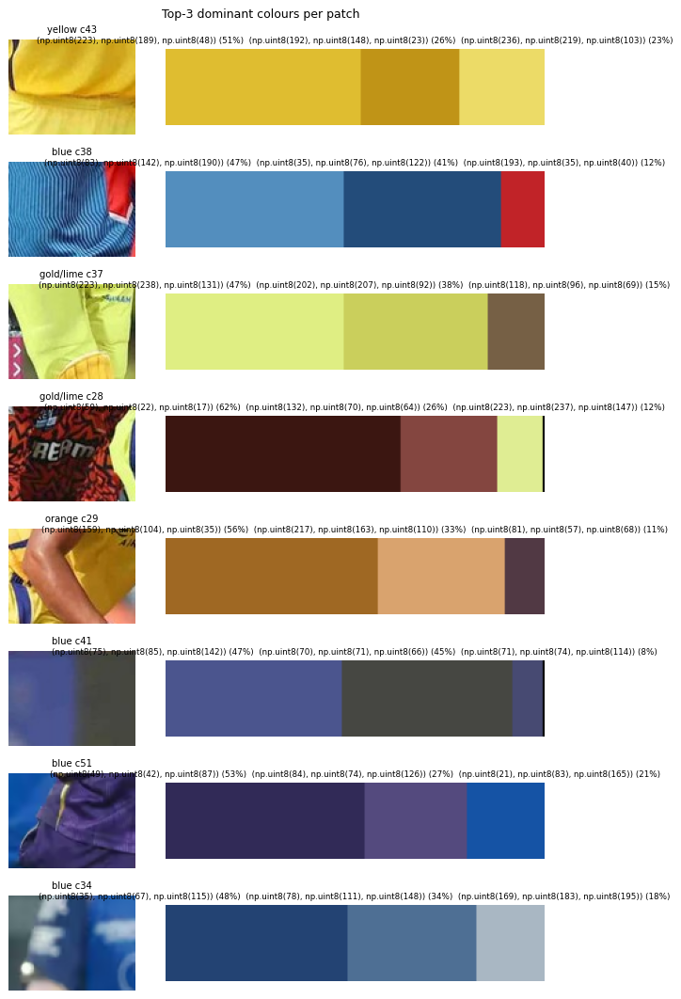

In [16]:
def dominant_colors(patch_rgb, k=3):
    pix = patch_rgb.reshape(-1, 3).astype(np.float32)
    km = KMeans(n_clusters=k, n_init=5, random_state=0).fit(pix)
    counts = np.bincount(km.labels_, minlength=k)
    order = counts.argsort()[::-1]
    centers = km.cluster_centers_[order].astype(np.uint8)
    shares  = counts[order] / counts.sum()
    return centers, shares

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(n, 2, figsize=(7, 1.5 * n), gridspec_kw={'width_ratios': [1, 2]})
if n == 1:
    axes = axes.reshape(1, 2)
for row, p in enumerate(PATCH_REGISTRY):
    centers, shares = dominant_colors(p['rgb'], k=3)
    axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
    axes[row, 0].set_title(f"{p['family']} c{p['cell']:02d}", fontsize=8)
    swatch_w = 200
    swatch = np.zeros((40, swatch_w, 3), dtype=np.uint8)
    x = 0
    for col, share in zip(centers, shares):
        w = int(round(share * swatch_w))
        swatch[:, x:x + w] = col; x += w
    axes[row, 1].imshow(swatch); axes[row, 1].axis('off')
    axes[row, 1].set_title('  '.join(f'{tuple(c)} ({s*100:.0f}%)' for c, s in zip(centers, shares)), fontsize=7)
plt.suptitle('Top-3 dominant colours per patch', fontsize=10)
plt.tight_layout(); plt.show()


**Why robust:** the palette survives small occlusions (bat handle, helmet) because it describes the *whole* cell. Relative shares give us a richer signature than a single hue peak.

---
## 5. HOG — Histogram of Oriented Gradients

**Captures:** dominant edge orientations in each sub-block → encodes *shape and pattern*, not colour.

**Useful here because:**
- Logos, numbers, sponsor text produce a structured HOG signature.
- A fan's plain T-shirt in the background, even in team colour, has almost no internal edges → low HOG energy. This is the crowd-vs-player disambiguator from EdgeCases.md.

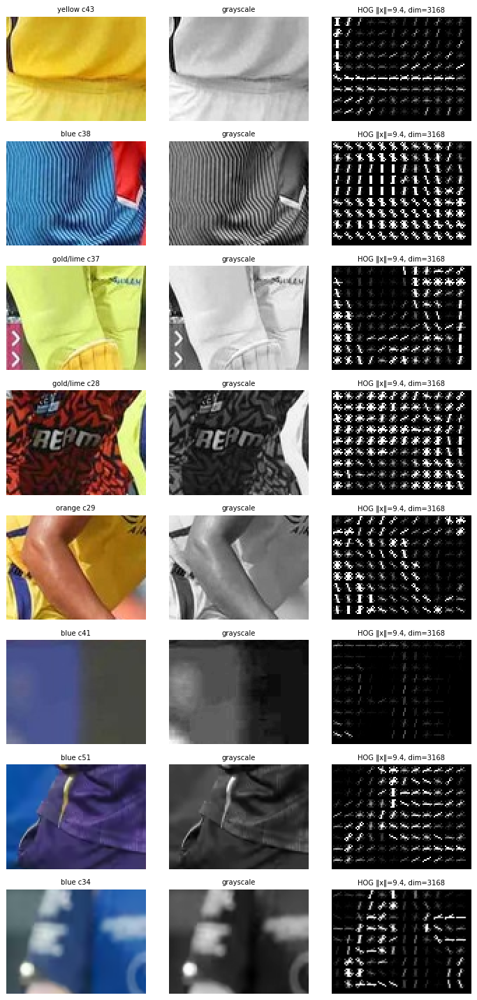

HOG energy ranking (higher = more structured edges → more likely real player):
  CSKvsSRH_image_34          c28 (gold/lime)  ‖HOG‖ = 9.3808
  CSKvsDC_image_44           c43 (yellow   )  ‖HOG‖ = 9.3808
  test_image                 c51 (blue     )  ‖HOG‖ = 9.3808
  GTvsCSK_image_23           c29 (orange   )  ‖HOG‖ = 9.3808
  CSKvsDC_image_44           c38 (blue     )  ‖HOG‖ = 9.3808
  CSKvsSRH_image_34          c37 (gold/lime)  ‖HOG‖ = 9.3808
  test_image                 c34 (blue     )  ‖HOG‖ = 9.3808
  GTvsCSK_image_23           c41 (blue     )  ‖HOG‖ = 9.3808


In [18]:
def hog_features_and_image(patch_rgb):
    gray = cv2.cvtColor(patch_rgb, cv2.COLOR_RGB2GRAY)
    feats, img = hog(gray, orientations=9, pixels_per_cell=(8, 8),
                     cells_per_block=(2, 2), visualize=True, feature_vector=True)
    img = exposure.rescale_intensity(img, in_range=(0, 10))
    return feats, img, gray

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(n, 3, figsize=(8, 2.0 * n))
if n == 1:
    axes = axes.reshape(1, 3)
hog_energies = []
for row, p in enumerate(PATCH_REGISTRY):
    feats, hog_img, gray = hog_features_and_image(p['rgb'])
    hog_energies.append((p, float(np.linalg.norm(feats))))
    axes[row, 0].imshow(p['rgb']); axes[row, 0].set_title(f"{p['family']} c{p['cell']:02d}", fontsize=8); axes[row, 0].axis('off')
    axes[row, 1].imshow(gray, cmap='gray'); axes[row, 1].set_title('grayscale', fontsize=8); axes[row, 1].axis('off')
    axes[row, 2].imshow(hog_img, cmap='gray'); axes[row, 2].set_title(f'HOG ‖x‖={np.linalg.norm(feats):.1f}, dim={len(feats)}', fontsize=8); axes[row, 2].axis('off')
plt.tight_layout(); plt.show()

print('HOG energy ranking (higher = more structured edges → more likely real player):')
for p, e in sorted(hog_energies, key=lambda x: -x[1]):
    print(f"  {p['image']:<26s} c{p['cell']:02d} ({p['family']:<9s})  ‖HOG‖ = {e:.4f}")

---
## 6. LBP — Local Binary Patterns

**Captures:** micro-texture. Compares each pixel to its 8 neighbours; the histogram of resulting codes describes texture independent of colour and absolute brightness.

**Useful because:**
- Smooth fabric vs textured kit.
- Low-quality / compressed jerseys produce a distinct LBP profile → image-quality signal.
- LBP is mostly invariant to lighting magnitude → survives floodlight V-drops better than HSV.

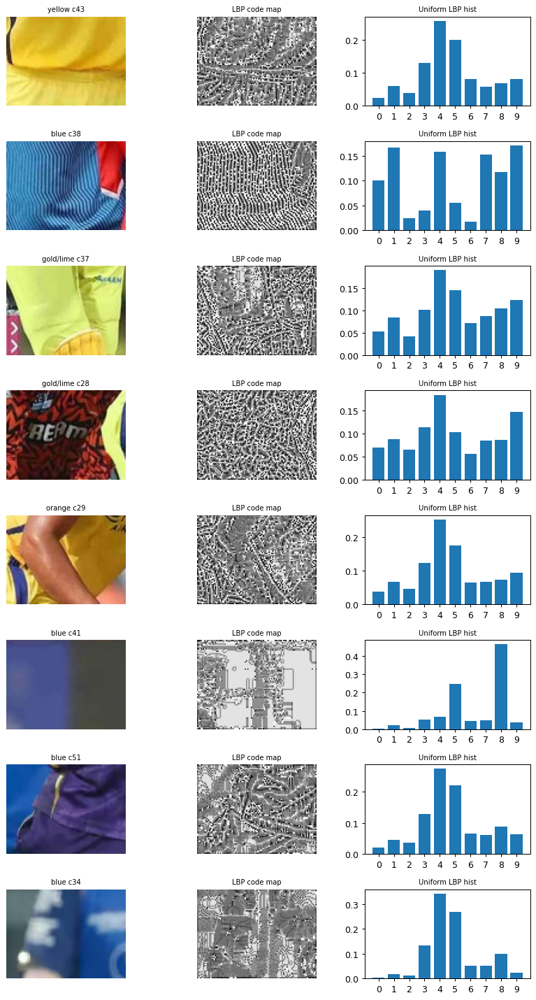

In [19]:
P, R = 8, 1
n_bins = P + 2   # uniform LBP

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(n, 3, figsize=(9, 2.0 * n))
if n == 1:
    axes = axes.reshape(1, 3)
for row, p in enumerate(PATCH_REGISTRY):
    gray = cv2.cvtColor(p['rgb'], cv2.COLOR_RGB2GRAY)
    lbp = local_binary_pattern(gray, P=P, R=R, method='uniform')
    h, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins))
    h = h / (h.sum() + 1e-9)
    axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
    axes[row, 0].set_title(f"{p['family']} c{p['cell']:02d}", fontsize=8)
    axes[row, 1].imshow(lbp, cmap='gray'); axes[row, 1].axis('off'); axes[row, 1].set_title('LBP code map', fontsize=8)
    axes[row, 2].bar(range(n_bins), h); axes[row, 2].set_title('Uniform LBP hist', fontsize=8); axes[row, 2].set_xticks(range(n_bins))
plt.tight_layout(); plt.show()

---
## 7. GLCM — Gray-Level Co-occurrence Matrix

**Captures:** second-order texture stats — how often pixel-pair values co-occur at a given offset. Four classic Haralick summaries:

- **Contrast** — local intensity variation; striped ≫ plain.
- **Homogeneity** — concentration on the diagonal; plain ≫ patterned.
- **Energy** — sum of squared entries; high for uniform texture.
- **Correlation** — linear dependency of pixel pairs; high for smooth gradients.

**Useful here because:** separates patterned jerseys (RR pink/blue panels) from flat ones (CSK plain front). Complements LBP — LBP *fingerprints* the texture, GLCM measures its *intensity* and *regularity*.

GLCM Haralick features (averaged over 4 angles):
           patch    family  contrast  homogeneity  energy  correlation
CSKvsDC_imag/c43    yellow     2.724        0.765   0.205        0.886
CSKvsDC_imag/c38      blue    24.052        0.292   0.076        0.410
CSKvsSRH_ima/c37 gold/lime     7.099        0.666   0.203        0.879
CSKvsSRH_ima/c28 gold/lime    12.228        0.466   0.128        0.904
GTvsCSK_imag/c29    orange     5.674        0.665   0.178        0.887
GTvsCSK_imag/c41      blue     0.069        0.966   0.468        0.981
  test_image/c51      blue     2.094        0.744   0.233        0.850
  test_image/c34      blue     1.353        0.772   0.212        0.979


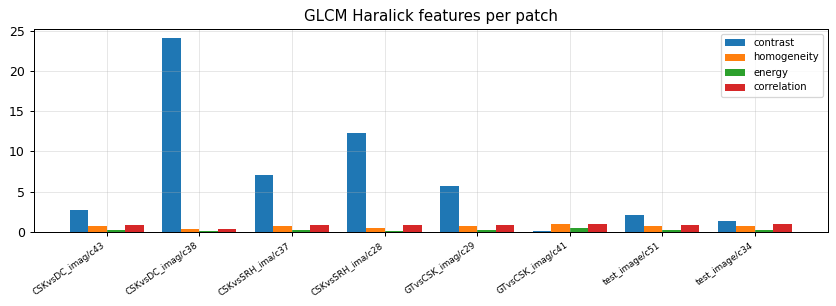

In [20]:
GLCM_PROPS = ['contrast', 'homogeneity', 'energy', 'correlation']
GLCM_ANGLES = [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4]

def glcm_features(patch_rgb, levels=32):
    gray = cv2.cvtColor(patch_rgb, cv2.COLOR_RGB2GRAY)
    gray_q = (gray // (256 // levels)).astype(np.uint8)
    glcm = graycomatrix(gray_q, distances=[1], angles=GLCM_ANGLES,
                        levels=levels, symmetric=True, normed=True)
    return {prop: float(graycoprops(glcm, prop).ravel().mean()) for prop in GLCM_PROPS}

rows = []
for p in PATCH_REGISTRY:
    f = glcm_features(p['rgb'])
    f.update({'patch': f"{p['image'][:12]}/c{p['cell']:02d}", 'family': p['family']})
    rows.append(f)
df_glcm = pd.DataFrame(rows)[['patch', 'family'] + GLCM_PROPS]
print('GLCM Haralick features (averaged over 4 angles):')
print(df_glcm.round(3).to_string(index=False))

n = len(PATCH_REGISTRY)
fig, ax = plt.subplots(figsize=(1.4 + 1.0 * n, 3.5))
x = np.arange(n)
width = 0.2
for i, prop in enumerate(GLCM_PROPS):
    ax.bar(x + (i - 1.5) * width, df_glcm[prop], width, label=prop)
ax.set_xticks(x); ax.set_xticklabels([r['patch'] for r in rows], rotation=35, ha='right', fontsize=7)
ax.set_title('GLCM Haralick features per patch'); ax.legend(fontsize=8); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

---
## 8. Gabor Filter Bank

**Captures:** response to oriented sinusoidal filters at multiple frequencies. A hand-picked, multi-scale, multi-orientation edge/texture detector.

**Useful here because:**
- Catches directional patterns: KKR diagonal stripes, MI vertical pinstripes, GT side panels.
- Different logo placements produce distinct low-frequency responses.
- Complementary to HOG: HOG bins gradient orientations (coarse), Gabor gives a continuous per-pixel response we can summarise.

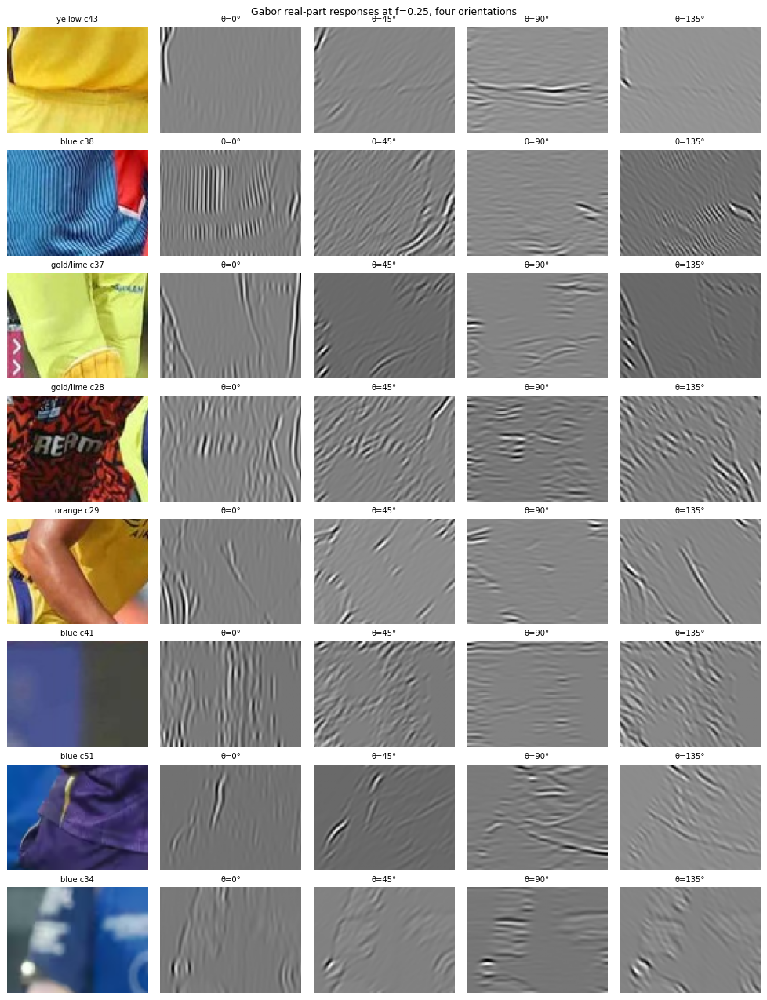

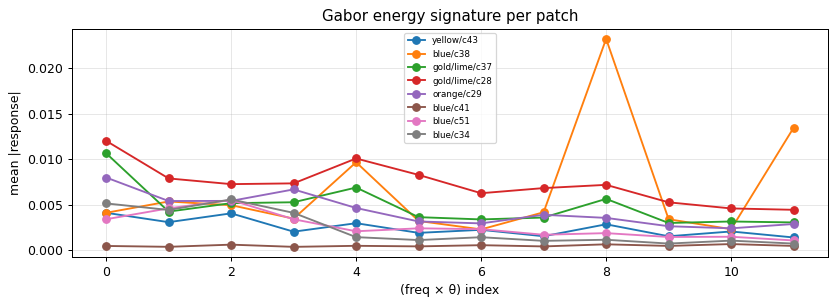

In [21]:
GABOR_FREQS = [0.1, 0.25, 0.4]
GABOR_THETAS = [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4]

n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(n, 5, figsize=(11, 1.8 * n))
if n == 1:
    axes = axes.reshape(1, 5)
for row, p in enumerate(PATCH_REGISTRY):
    gray = cv2.cvtColor(p['rgb'], cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
    axes[row, 0].set_title(f"{p['family']} c{p['cell']:02d}", fontsize=8)
    for j, th in enumerate(GABOR_THETAS):
        real, _ = gabor(gray, frequency=0.25, theta=th)
        axes[row, j + 1].imshow(real, cmap='gray'); axes[row, j + 1].axis('off')
        axes[row, j + 1].set_title(f'θ={int(np.degrees(th))}°', fontsize=8)
plt.suptitle('Gabor real-part responses at f=0.25, four orientations', fontsize=10)
plt.tight_layout(); plt.show()

# Per-patch energy signature across all (freq × θ)
fig, ax = plt.subplots(figsize=(1.4 + 1.0 * n, 3.5))
for p in PATCH_REGISTRY:
    gray = cv2.cvtColor(p['rgb'], cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    energies = []
    for f in GABOR_FREQS:
        for th in GABOR_THETAS:
            real, _ = gabor(gray, frequency=f, theta=th)
            energies.append(np.abs(real).mean())
    ax.plot(energies, marker='o', label=f"{p['family']}/c{p['cell']:02d}")
ax.set_xlabel('(freq × θ) index'); ax.set_ylabel('mean |response|')
ax.set_title('Gabor energy signature per patch'); ax.legend(fontsize=7); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

---
## 9. Canny + Sobel Edges

**Sobel** = continuous gradient magnitude. **Canny** = binary thinned edges, perfect for counting structure.

**Useful here:** a real jersey shows visible edges from logos, numbers, sponsor text, neckline, sleeve creases. *Edge density* is a strong single-number signal for *"player vs sky/pitch/sponsor board"*.

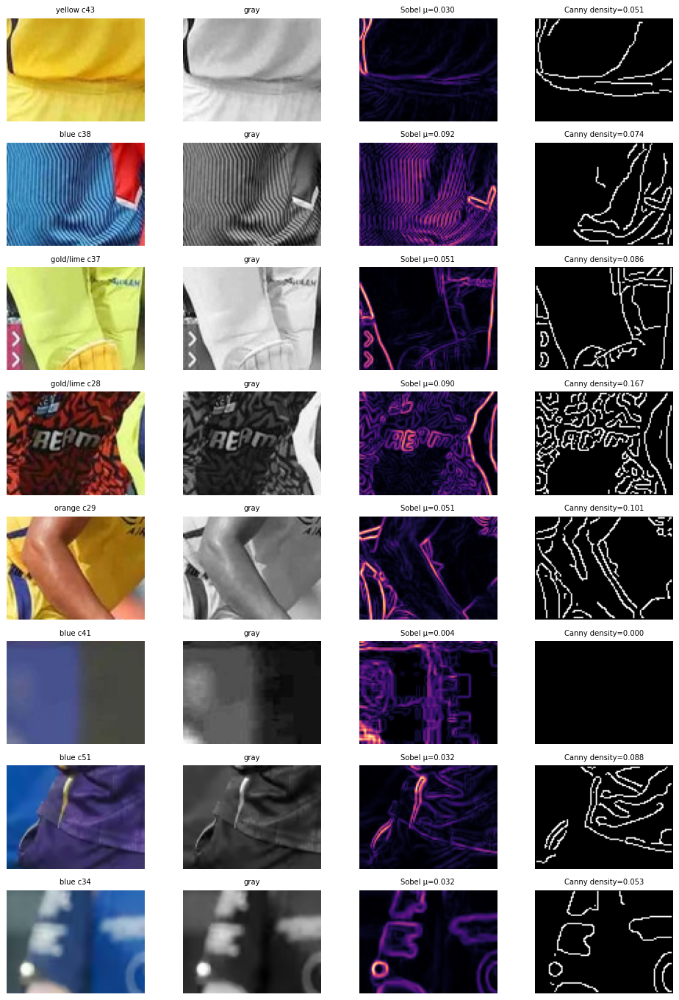

Canny edge density ranking:
  CSKvsSRH_image_34          c28 (gold/lime)  canny=0.167  sobel_μ=0.090
  GTvsCSK_image_23           c29 (orange   )  canny=0.101  sobel_μ=0.051
  test_image                 c51 (blue     )  canny=0.088  sobel_μ=0.032
  CSKvsSRH_image_34          c37 (gold/lime)  canny=0.086  sobel_μ=0.051
  CSKvsDC_image_44           c38 (blue     )  canny=0.074  sobel_μ=0.092
  test_image                 c34 (blue     )  canny=0.053  sobel_μ=0.032
  CSKvsDC_image_44           c43 (yellow   )  canny=0.051  sobel_μ=0.030
  GTvsCSK_image_23           c41 (blue     )  canny=0.000  sobel_μ=0.004


In [22]:
n = len(PATCH_REGISTRY)
fig, axes = plt.subplots(n, 4, figsize=(11, 1.9 * n))
if n == 1:
    axes = axes.reshape(1, 4)
edge_stats = []
for row, p in enumerate(PATCH_REGISTRY):
    gray = cv2.cvtColor(p['rgb'], cv2.COLOR_RGB2GRAY)
    sob = sobel(gray.astype(np.float32) / 255.0)
    can = canny(gray, sigma=1.5)
    edge_stats.append((p, float(can.mean()), float(sob.mean())))
    axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
    axes[row, 0].set_title(f"{p['family']} c{p['cell']:02d}", fontsize=8)
    axes[row, 1].imshow(gray, cmap='gray'); axes[row, 1].axis('off'); axes[row, 1].set_title('gray', fontsize=8)
    axes[row, 2].imshow(sob, cmap='magma'); axes[row, 2].axis('off')
    axes[row, 2].set_title(f'Sobel μ={sob.mean():.3f}', fontsize=8)
    axes[row, 3].imshow(can, cmap='gray'); axes[row, 3].axis('off')
    axes[row, 3].set_title(f'Canny density={can.mean():.3f}', fontsize=8)
plt.tight_layout(); plt.show()

print('Canny edge density ranking:')
for p, cd, sd in sorted(edge_stats, key=lambda x: -x[1]):
    print(f"  {p['image']:<26s} c{p['cell']:02d} ({p['family']:<9s})  canny={cd:.3f}  sobel_μ={sd:.3f}")

---
# 10. Edge Case Probes

Below we simulate the conditions in `EdgeCases.md` and watch which features stay stable. **Stable under perturbation ⇒ safe to put in the feature vector.**

### 10.1 Lighting variation — floodlight V-drop & overexposure

EdgeCases.md §2: floodlights drop `V` 40–60% and yellow CSK can look olive; daylight pushes `S → 0` for whites. We perturb one patch and re-extract every feature.

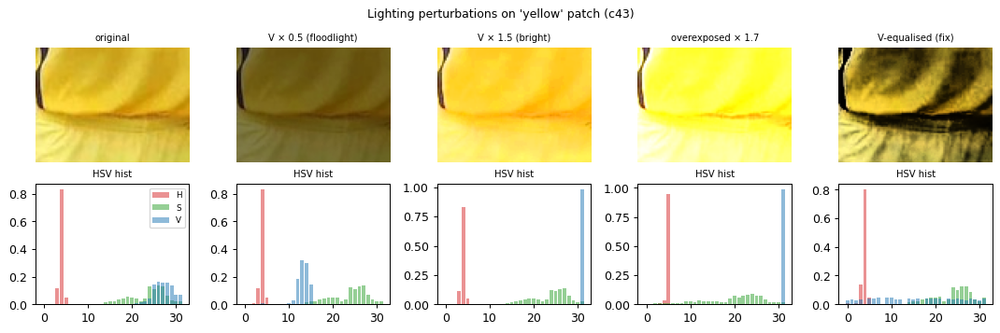

Hue-histogram drift (χ² from original):
  original                  χ²=0.000
  V × 0.5 (floodlight)      χ²=0.000
  V × 1.5 (bright)          χ²=0.000
  overexposed × 1.7         χ²=0.818
  V-equalised (fix)         χ²=0.006

LAB mean drift (lower = more stable):
  original                  ΔL=  +0.0  Δa=  +0.0  Δb=  +0.0
  V × 0.5 (floodlight)      ΔL= -93.4  Δa=  +0.3  Δb= -27.6
  V × 1.5 (bright)          ΔL= +26.5  Δa=  +0.5  Δb=  +8.4
  overexposed × 1.7         ΔL= +51.3  Δa= -15.6  Δb=  +4.9
  V-equalised (fix)         ΔL= -74.6  Δa=  -0.8  Δb= -24.1


In [23]:
ref = PATCH_REGISTRY[0]

def adjust_v(patch_rgb, gain):
    hsv = cv2.cvtColor(patch_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    hsv[..., 2] = np.clip(hsv[..., 2] * gain, 0, 255)
    return cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)

def overexpose(patch_rgb, gain=1.7):
    return np.clip(patch_rgb.astype(np.float32) * gain, 0, 255).astype(np.uint8)

variants = {
    'original':                ref['rgb'],
    'V × 0.5 (floodlight)':    adjust_v(ref['rgb'], 0.5),
    'V × 1.5 (bright)':        adjust_v(ref['rgb'], 1.5),
    'overexposed × 1.7':       overexpose(ref['rgb'], 1.7),
}
# Recommended fix from EdgeCases.md: equalise V channel
_dark = adjust_v(ref['rgb'], 0.5)
_hsv  = cv2.cvtColor(_dark, cv2.COLOR_RGB2HSV)
_hsv[..., 2] = cv2.equalizeHist(_hsv[..., 2])
variants['V-equalised (fix)'] = cv2.cvtColor(_hsv, cv2.COLOR_HSV2RGB)

fig, axes = plt.subplots(2, len(variants), figsize=(2.4 * len(variants), 4))
for col, (name, img) in enumerate(variants.items()):
    axes[0, col].imshow(img); axes[0, col].set_title(name, fontsize=8); axes[0, col].axis('off')
    H, S, V = hsv_hist(img)
    axes[1, col].bar(range(len(H)), H, color='tab:red',   alpha=0.5, label='H')
    axes[1, col].bar(range(len(S)), S, color='tab:green', alpha=0.5, label='S')
    axes[1, col].bar(range(len(V)), V, color='tab:blue',  alpha=0.5, label='V')
    axes[1, col].set_title('HSV hist', fontsize=8)
    if col == 0: axes[1, col].legend(fontsize=7)
plt.suptitle(f"Lighting perturbations on '{ref['family']}' patch (c{ref['cell']:02d})", fontsize=10)
plt.tight_layout(); plt.show()

# Drift table
orig_H = hsv_hist(variants['original'])[0]
print('Hue-histogram drift (χ² from original):')
for name, img in variants.items():
    print(f"  {name:<24s}  χ²={chi2(orig_H, hsv_hist(img)[0]):.3f}")

orig_LAB = cv2.cvtColor(variants['original'], cv2.COLOR_RGB2LAB).reshape(-1, 3).mean(0)
print('\nLAB mean drift (lower = more stable):')
for name, img in variants.items():
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB).reshape(-1, 3).mean(0)
    print(f"  {name:<24s}  ΔL={lab[0]-orig_LAB[0]:+6.1f}  Δa={lab[1]-orig_LAB[1]:+6.1f}  Δb={lab[2]-orig_LAB[2]:+6.1f}")

**Takeaways:**
- Hue is *mostly* stable under V changes (good).
- Saturation collapses on overexposure → never rely on `S` alone for whites.
- `cv2.equalizeHist` on `V` substantially restores the original histogram (the EdgeCases.md fix).
- LAB `a*`, `b*` shifts are typically smaller in magnitude than HSV histogram drifts → LAB is the better colour feature.

### 10.2 Same-family hue conflict (CSK-yellow vs GT-gold pattern)

If two patches share a `family` they are a *real* hue-conflict pair. We visualise hue, LAB and joint H×S to confirm that joint-HS / LAB add the missing signal.

Conflict family: blue.  Patches: CSKvsDC_image_44/c38  vs  GTvsCSK_image_23/c41


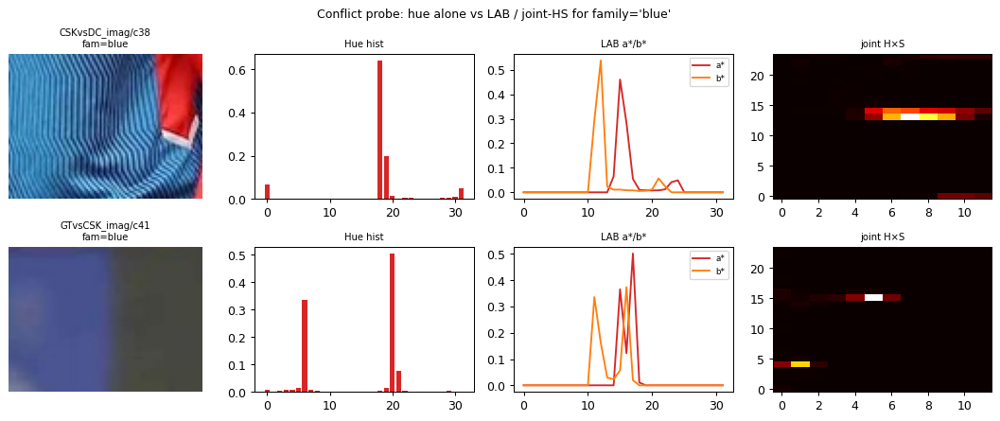


χ² hue-only:  0.909
χ² joint-HS:  2.835  ← larger = HS adds signal


In [24]:
by_family = defaultdict(list)
for p in PATCH_REGISTRY:
    by_family[p['family']].append(p)

conflicts = [f for f, lst in by_family.items() if len(lst) >= 2]
if not conflicts:
    print('No same-family conflicts in current sample. Add more images / overrides to probe this.')
else:
    fam = conflicts[0]
    a, b = by_family[fam][:2]
    print(f"Conflict family: {fam}.  Patches: {a['image']}/c{a['cell']:02d}  vs  {b['image']}/c{b['cell']:02d}")
    fig, axes = plt.subplots(2, 4, figsize=(12, 5))
    for row, p in enumerate([a, b]):
        axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
        axes[row, 0].set_title(f"{p['image'][:12]}/c{p['cell']:02d}\nfam={p['family']}", fontsize=8)
        H, _, _ = hsv_hist(p['rgb'])
        axes[row, 1].bar(range(len(H)), H, color='tab:red'); axes[row, 1].set_title('Hue hist', fontsize=8)
        lab = cv2.cvtColor(p['rgb'], cv2.COLOR_RGB2LAB)
        for ch, col, name in zip([1, 2], ['tab:red', 'tab:orange'], ['a*', 'b*']):
            h, _ = np.histogram(lab[..., ch], bins=32, range=(0, 256))
            axes[row, 2].plot(h / (h.sum() + 1e-9), label=name, color=col)
        axes[row, 2].set_title('LAB a*/b*', fontsize=8); axes[row, 2].legend(fontsize=7)
        axes[row, 3].imshow(hs_hist2d(p['rgb']), origin='lower', aspect='auto', cmap='hot')
        axes[row, 3].set_title('joint H×S', fontsize=8)
    plt.suptitle(f"Conflict probe: hue alone vs LAB / joint-HS for family='{fam}'", fontsize=10)
    plt.tight_layout(); plt.show()

    H_a, H_b   = hsv_hist(a['rgb'])[0], hsv_hist(b['rgb'])[0]
    hs_a, hs_b = hs_hist2d(a['rgb']).ravel(), hs_hist2d(b['rgb']).ravel()
    print(f'\nχ² hue-only:  {chi2(H_a, H_b):.3f}')
    print(f'χ² joint-HS:  {chi2(hs_a, hs_b):.3f}  ← larger = HS adds signal')


### 10.3 Crowd / background contamination — HOG to the rescue

Compare each jersey patch against a low-saturation background-y cell from the same image. We expect:
- Colour histograms might be similar if crowd wears team colours.
- *But* HOG energy and Canny density should be far higher for the jersey because of logos / numbers / neckline.

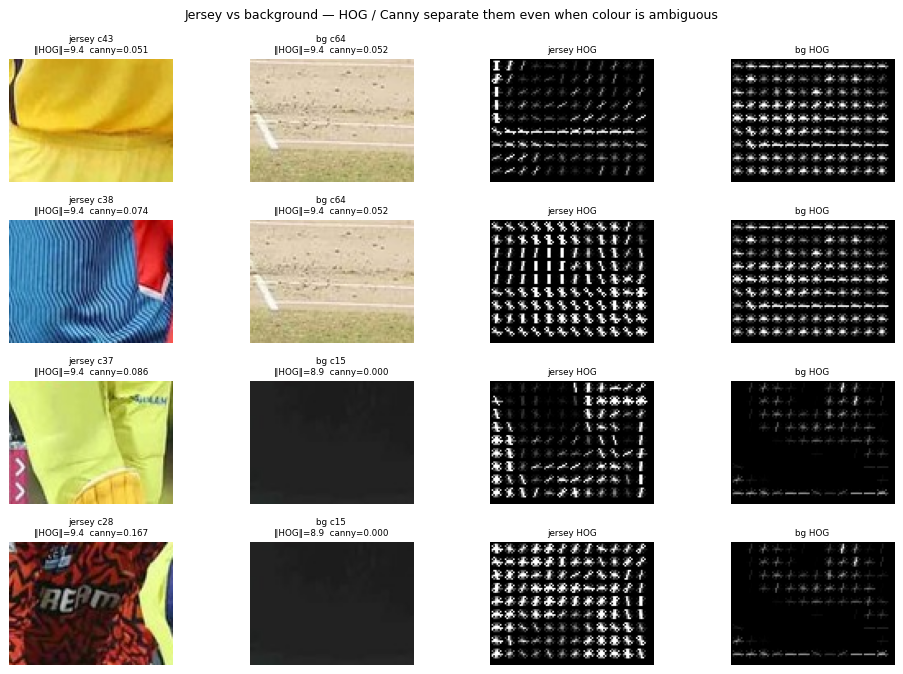

In [25]:
def pick_background_cell(img_rgb, used_cells):
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    scores = np.zeros(GRID_ROWS * GRID_COLS)
    for r in range(GRID_ROWS):
        for c in range(GRID_COLS):
            cell_sat = hsv[r*CELL_H:(r+1)*CELL_H, c*CELL_W:(c+1)*CELL_W, 1].mean()
            cell_var = hsv[r*CELL_H:(r+1)*CELL_H, c*CELL_W:(c+1)*CELL_W, 2].var()
            scores[r*GRID_COLS + c] = cell_sat + 0.01 * cell_var
    for cell_idx in scores.argsort():
        cell_1b = int(cell_idx) + 1
        if cell_1b not in used_cells:
            return cell_1b
    return 1

pair_rows = []
for p in PATCH_REGISTRY[:4]:
    used = {pp['cell'] for pp in PATCH_REGISTRY if pp['image'] == p['image']}
    bg_idx = pick_background_cell(IMAGES[p['image']], used)
    pair_rows.append((p, bg_idx, get_cell(IMAGES[p['image']], bg_idx)))

fig, axes = plt.subplots(len(pair_rows), 4, figsize=(11, 1.9 * len(pair_rows)))
if len(pair_rows) == 1:
    axes = axes.reshape(1, 4)
for row, (p, bg_idx, bg) in enumerate(pair_rows):
    jh, jh_img, _ = hog_features_and_image(p['rgb'])
    bh, bh_img, _ = hog_features_and_image(bg)
    jc = canny(cv2.cvtColor(p['rgb'], cv2.COLOR_RGB2GRAY), sigma=1.5).mean()
    bc = canny(cv2.cvtColor(bg,       cv2.COLOR_RGB2GRAY), sigma=1.5).mean()
    axes[row, 0].imshow(p['rgb']); axes[row, 0].axis('off')
    axes[row, 0].set_title(f"jersey c{p['cell']:02d}\n‖HOG‖={np.linalg.norm(jh):.1f}  canny={jc:.3f}", fontsize=7)
    axes[row, 1].imshow(bg); axes[row, 1].axis('off')
    axes[row, 1].set_title(f"bg c{bg_idx:02d}\n‖HOG‖={np.linalg.norm(bh):.1f}  canny={bc:.3f}", fontsize=7)
    axes[row, 2].imshow(jh_img, cmap='gray'); axes[row, 2].axis('off'); axes[row, 2].set_title('jersey HOG', fontsize=7)
    axes[row, 3].imshow(bh_img, cmap='gray'); axes[row, 3].axis('off'); axes[row, 3].set_title('bg HOG',     fontsize=7)
plt.suptitle('Jersey vs background — HOG / Canny separate them even when colour is ambiguous', fontsize=10)
plt.tight_layout(); plt.show()

### 10.4 Blur / quality gate — Laplacian variance

EdgeCases.md §7 recommends rejecting whole images with `Laplacian variance < 100`. We also flag *cells* with low local Laplacian variance as background (label 0).

Whole-image Laplacian variance (recommended reject < 100):
  CSKvsDC_image_44             =  2964.20
  CSKvsSRH_image_34            =   845.77
  GTvsCSK_image_23             =   421.37
  test_image                   =   256.44


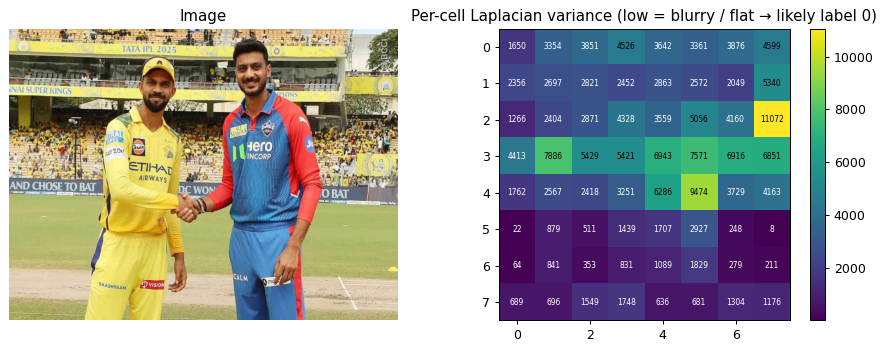

In [26]:
def laplacian_var(patch_rgb):
    gray = cv2.cvtColor(patch_rgb, cv2.COLOR_RGB2GRAY)
    return float(cv2.Laplacian(gray, cv2.CV_64F).var())

print('Whole-image Laplacian variance (recommended reject < 100):')
for name, img in IMAGES.items():
    print(f"  {name:<28s} = {laplacian_var(img):8.2f}")

img0 = next(iter(IMAGES.values()))
lap_grid = np.zeros((GRID_ROWS, GRID_COLS))
for r in range(GRID_ROWS):
    for c in range(GRID_COLS):
        lap_grid[r, c] = laplacian_var(img0[r*CELL_H:(r+1)*CELL_H, c*CELL_W:(c+1)*CELL_W])

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(img0); axes[0].set_title('Image'); axes[0].axis('off')
im = axes[1].imshow(lap_grid, cmap='viridis')
for r in range(GRID_ROWS):
    for c in range(GRID_COLS):
        axes[1].text(c, r, f'{lap_grid[r,c]:.0f}', ha='center', va='center', fontsize=6,
                     color='white' if lap_grid[r, c] < lap_grid.max() * 0.4 else 'black')
axes[1].set_title('Per-cell Laplacian variance (low = blurry / flat → likely label 0)')
plt.colorbar(im, ax=axes[1], fraction=0.04); plt.tight_layout(); plt.show()

### 10.5 White / over-exposure detection (LSG white-alt vs sight-screen)

Pure overexposed white has `S ≈ 0`, `V ≈ 255`. White fabric carries slight tint and texture. Decision rule:
- low `S` **AND** low Laplacian variance → background (label 0).
- low `S` **AND** moderate Laplacian variance → likely actual white jersey.

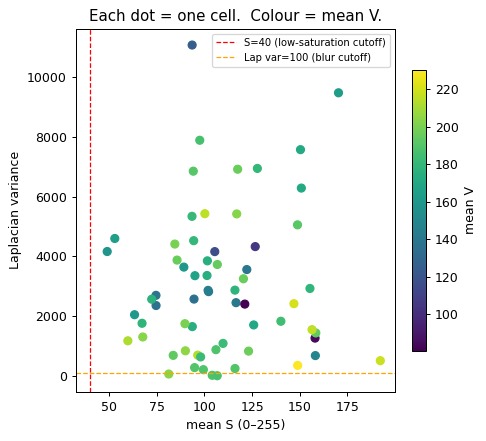

Cells in this image classified by simple rule:
  low-S & high-lap  (white jersey candidate): 0
  low-S & low-lap   (background / overexposed): 0
  high-S            (coloured jersey region): 64


In [27]:
img0 = next(iter(IMAGES.values()))
S_grid   = np.zeros((GRID_ROWS, GRID_COLS))
V_grid   = np.zeros((GRID_ROWS, GRID_COLS))
lap_grid = np.zeros((GRID_ROWS, GRID_COLS))
for r in range(GRID_ROWS):
    for c in range(GRID_COLS):
        cell = img0[r*CELL_H:(r+1)*CELL_H, c*CELL_W:(c+1)*CELL_W]
        hsv = cv2.cvtColor(cell, cv2.COLOR_RGB2HSV)
        S_grid[r, c]   = hsv[..., 1].mean()
        V_grid[r, c]   = hsv[..., 2].mean()
        lap_grid[r, c] = laplacian_var(cell)

fig, ax = plt.subplots(figsize=(5.5, 5))
sc = ax.scatter(S_grid.ravel(), lap_grid.ravel(), c=V_grid.ravel(), cmap='viridis', s=40)
ax.set_xlabel('mean S (0–255)'); ax.set_ylabel('Laplacian variance')
ax.set_title('Each dot = one cell.  Colour = mean V.')
ax.axvline(40, color='red', ls='--', lw=1, label='S=40 (low-saturation cutoff)')
ax.axhline(100, color='orange', ls='--', lw=1, label='Lap var=100 (blur cutoff)')
ax.legend(fontsize=8); plt.colorbar(sc, ax=ax, label='mean V', fraction=0.04); plt.tight_layout(); plt.show()

# Quadrant decision summary
n_white_jersey = ((S_grid < 40) & (lap_grid > 100)).sum()
n_background   = ((S_grid < 40) & (lap_grid <= 100)).sum()
n_colored      = (S_grid >= 40).sum()
print(f'Cells in this image classified by simple rule:')
print(f'  low-S & high-lap  (white jersey candidate): {n_white_jersey}')
print(f'  low-S & low-lap   (background / overexposed): {n_background}')
print(f'  high-S            (coloured jersey region): {n_colored}')

---
## 11. Feature Discriminability Summary

For each feature we build a per-patch vector and compute the pairwise inter-patch distance matrix. Features whose **off-diagonal distances are large** are useful — they separate teams in feature space.

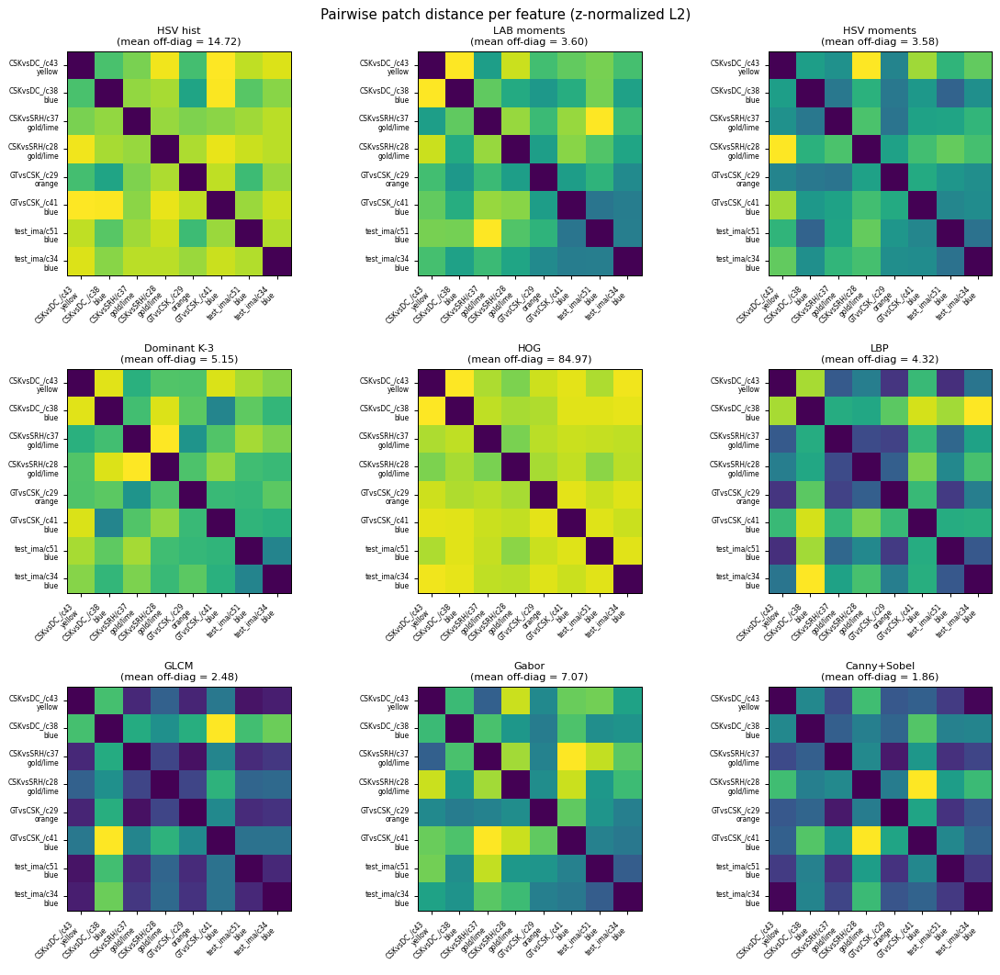

Feature discriminability ranking (higher mean off-diagonal distance = better separator):
  HOG             84.972
  HSV hist        14.718
  Gabor           7.066
  Dominant K-3    5.150
  LBP             4.320
  LAB moments     3.603
  HSV moments     3.579
  GLCM            2.480
  Canny+Sobel     1.860


In [28]:
def feat_hsv(patch):
    return np.concatenate(hsv_hist(patch))

def feat_lab_moments(patch):
    mu, sd, _ = color_moments(patch, space='LAB')
    return np.concatenate([mu, sd])

def feat_hsv_moments(patch):
    mu, sd, _ = color_moments(patch, space='HSV')
    return np.concatenate([mu, sd])

def feat_dominant(patch):
    c, s = dominant_colors(patch, k=3)
    return np.concatenate([c.ravel().astype(np.float32), s])

def feat_hog(patch):
    f, _, _ = hog_features_and_image(patch)
    return f

def feat_lbp(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)
    lbp = local_binary_pattern(gray, P=8, R=1, method='uniform')
    h, _ = np.histogram(lbp.ravel(), bins=10, range=(0, 10))
    return h / (h.sum() + 1e-9)

def feat_glcm(patch):
    f = glcm_features(patch)
    return np.array([f[k] for k in GLCM_PROPS])

def feat_gabor(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    out = []
    for f in GABOR_FREQS:
        for th in GABOR_THETAS:
            real, _ = gabor(gray, frequency=f, theta=th)
            out += [real.mean(), real.std()]
    return np.array(out)

def feat_edges(patch):
    gray = cv2.cvtColor(patch, cv2.COLOR_RGB2GRAY)
    return np.array([canny(gray, sigma=1.5).mean(), sobel(gray.astype(np.float32) / 255.0).mean()])

FEATURE_EXTRACTORS = {
    'HSV hist':       feat_hsv,
    'LAB moments':    feat_lab_moments,
    'HSV moments':    feat_hsv_moments,
    'Dominant K-3':   feat_dominant,
    'HOG':            feat_hog,
    'LBP':            feat_lbp,
    'GLCM':           feat_glcm,
    'Gabor':          feat_gabor,
    'Canny+Sobel':    feat_edges,
}

def pairwise_l2(vecs):
    V = np.stack(vecs)
    V = (V - V.mean(0)) / (V.std(0) + 1e-9)   # z-normalize per dim before distance
    D = np.sqrt(((V[:, None, :] - V[None, :, :]) ** 2).sum(-1))
    return D

n = len(PATCH_REGISTRY)
labels = [f"{p['image'][:8]}/c{p['cell']:02d}\n{p['family']}" for p in PATCH_REGISTRY]

fig, axes = plt.subplots(3, 3, figsize=(13, 12))
disc_scores = {}
for ax, (name, fn) in zip(axes.ravel(), FEATURE_EXTRACTORS.items()):
    vecs = [fn(p['rgb']) for p in PATCH_REGISTRY]
    D = pairwise_l2(vecs)
    # discriminability = mean off-diagonal distance / max
    off = D[~np.eye(n, dtype=bool)]
    disc_scores[name] = off.mean()
    im = ax.imshow(D, cmap='viridis')
    ax.set_xticks(range(n)); ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=6)
    ax.set_yticks(range(n)); ax.set_yticklabels(labels, fontsize=6)
    ax.set_title(f'{name}\n(mean off-diag = {off.mean():.2f})', fontsize=9)
plt.suptitle('Pairwise patch distance per feature (z-normalized L2)', fontsize=12)
plt.tight_layout(); plt.show()

print('Feature discriminability ranking (higher mean off-diagonal distance = better separator):')
for name, s in sorted(disc_scores.items(), key=lambda x: -x[1]):
    print(f"  {name:<14s}  {s:.3f}")

---
## 12. Conclusions & Recommended Feature Vector

What the experiments above suggest for the final feature vector (per 100×75 cell):

1. **Color foundation (mandatory)** — joint H×S 2-D histogram **+** LAB `a*` / `b*` histogram or LAB moments. HSV hue alone is *not* enough.

2. **Color palette (highly recommended)** — top-3 K-means dominant colors, flattened with their shares. Robust to occlusion, captures multi-colour jerseys.

3. **Texture (mandatory)** — *both* LBP (uniform, 10 bins) and a small GLCM summary (4 Haralick props × 4 angles). LBP is light + lighting-invariant; GLCM measures regularity.

4. **Shape / structure (highly recommended)** — HOG (9 orientations, 8×8 cells, 2×2 blocks). Single most useful feature for jersey-vs-crowd disambiguation.

5. **Directional patterns (optional v2)** — Gabor (3 frequencies × 4 orientations, mean & std → 24 numbers). Adds signal for striped / panelled jerseys.

6. **Quality / structure gates (cheap, must add)**:
    - Laplacian variance per cell — reject as label 0 if very low.
    - Canny edge density — reject as label 0 if very low even at high saturation.
    - Mean S — if very low, decide between *white jersey* (Lap > 100) vs *sight-screen* (Lap < 100).

7. **Meta-features (cheap, helps the classifier)**:
    - Grid row/col index — bottom rows are biased toward label 0 (shoes/grass).
    - Whole-image mean V — lets the model condition on day-vs-night matches.

### What we explicitly chose *not* to do
- Use HSV hue alone (CSK/GT and MI/DC collide).
- Use raw RGB histograms (too lighting-sensitive, no perceptual structure).
- Compute HOG on the colour image (gray HOG is faster and has comparable signal at 100×75 px).

### Open questions left for Phase 3
- Is per-cell PCA worth it given the feature vector will be ~3000-d? Test on a 500-cell sample.
- Should we extract features from left-half / right-half of the cell separately (EdgeCases.md §2 dusk-match fix)? Likely yes for night matches.